In [1]:
import json
import copy
import math

import cv2 as cv
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

import albumentations as album

In [2]:
# テスト用画像とバウンディングボックスを読み込み
test_image = cv.imread('image/hedgehog.jpg')
test_maskimage = cv.imread('image/hedgehog_mask.jpg')

bbox_json = open('image/hedgehog.json')
bbox_json = json.load(bbox_json)

bboxes = []
classes = []
for region in bbox_json.get('regions'):
    bbox = region.get('boundingBox')
    bboxes.append([bbox['left'], bbox['top'], bbox['width'], bbox['height']])
    classes.append(0)
    
# 画像、アノテーション情報保持用変数
annotation = {'image': test_image, 'bboxes': bboxes, 'category_id': classes}

In [3]:
# バウンディングボックス描画用関数
def draw_boundingbox(augmented_results, use_bbox=True, is_umat=False):
    column = 3
    row = math.ceil(len(augmented_results) / column)
    
    plt.figure(figsize=(16, 9))
    
    for i, augmented_result in enumerate(augmented_results):
        augmented_image = augmented_result['image']
        debug_image = copy.deepcopy(augmented_image)
        
        if use_bbox:
            augmented_bboxes = augmented_result['bboxes']
            augmented_category_id = augmented_result['category_id']
            for augmented_bbox in augmented_bboxes:
                x1, y1 = int(augmented_bbox[0]), int(augmented_bbox[1])
                x2, y2 = int(x1 + augmented_bbox[2]), int(y1 + augmented_bbox[3])

                debug_image = cv.rectangle(debug_image, (x1, y1), (x2, y2), (0,255,0), 5)
            
        if is_umat:
            debug_image = debug_image.get().astype('uint8')

        plt.subplot(row, column, i+1)
        plt.imshow(cv.cvtColor(debug_image, cv.COLOR_BGR2RGB))
        
    plt.show()  

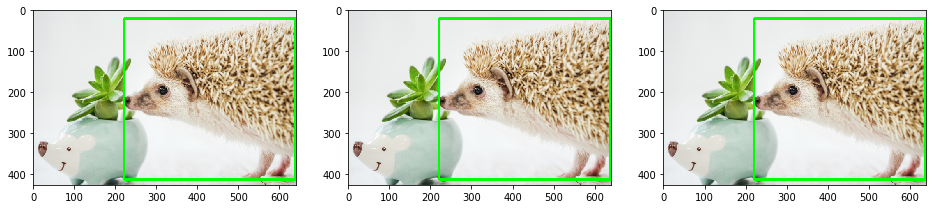

In [4]:
# 0．テスト用画像描画(データ拡張未実施)
def compose_augmentation():
    transform = [
        album.NoOp(),
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

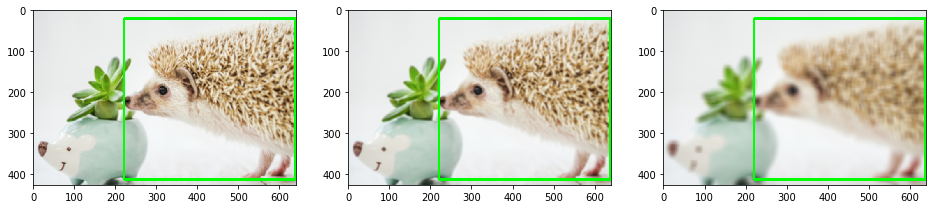

In [8]:
# 1．ぼかし(Blur)
def compose_augmentation():
    transform = [
        album.Blur(blur_limit=15, p=1.0),  # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

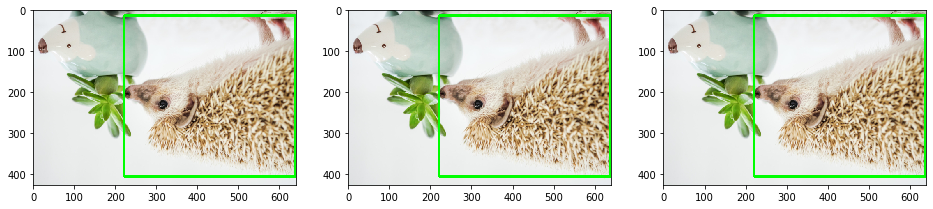

In [9]:
# 2．垂直反転(VerticalFlip)
def compose_augmentation():
    transform = [
        album.VerticalFlip(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

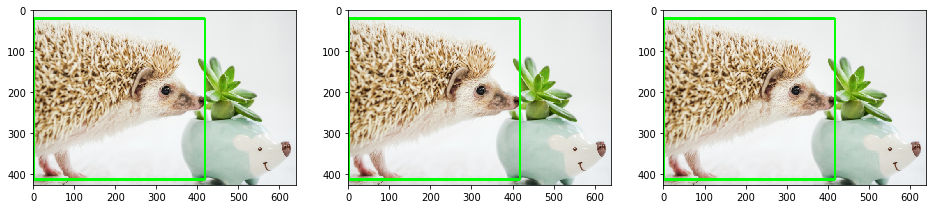

In [10]:
# 3．水平反転(HorizontalFlip)
def compose_augmentation():
    transform = [
        album.HorizontalFlip(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

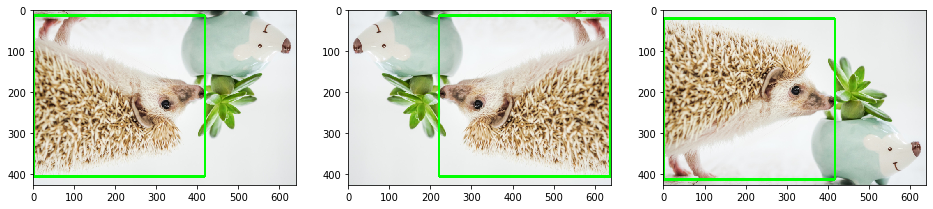

In [14]:
# 4．水平垂直反転(Flip)
def compose_augmentation():
    transform = [
        album.Flip(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


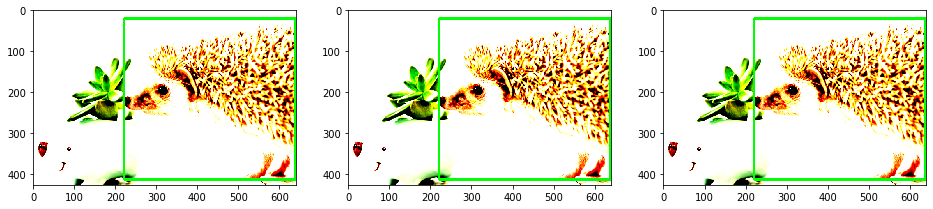

In [15]:
# 5．ノーマライズ(Normalize)
def compose_augmentation():
    transform = [
        album.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

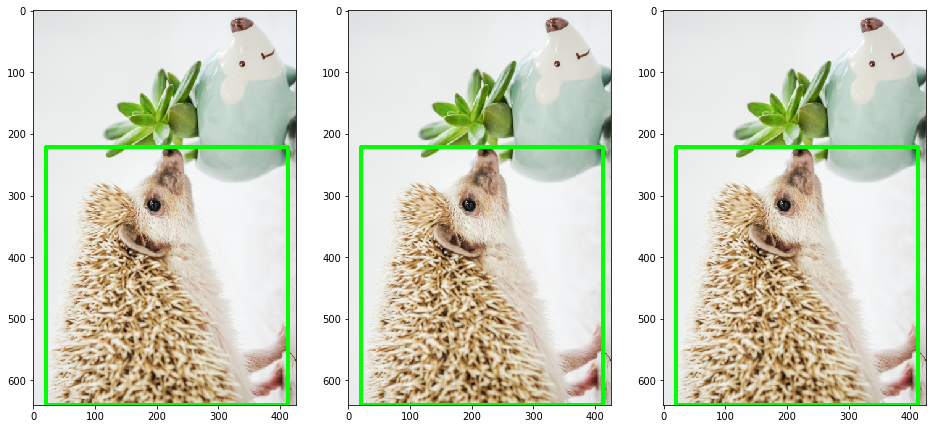

In [16]:
# 6．行列転置(Transpose)
def compose_augmentation():
    transform = [
        album.Transpose(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results, is_umat=True)

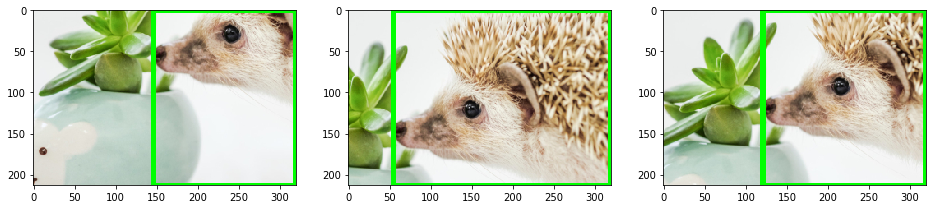

In [17]:
# 7．ランダムクロップ(RandomCrop)
crop_width, crop_height = int(test_image.shape[1] * 0.5), int(test_image.shape[0] * 0.5) 
def compose_augmentation():
    transform = [
        album.RandomCrop(height=crop_height, width=crop_width, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

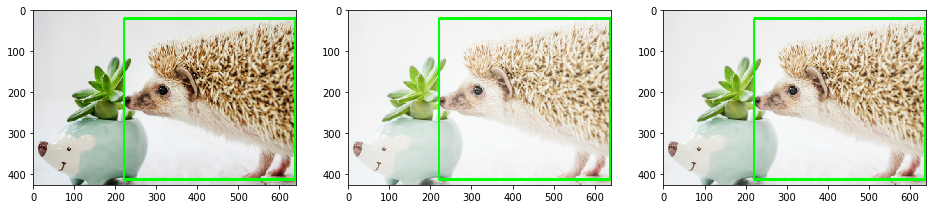

In [18]:
# 8．ランダムガンマ補正(RandomGamma)
def compose_augmentation():
    transform = [
        album.RandomGamma(gamma_limit=(50, 150), p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

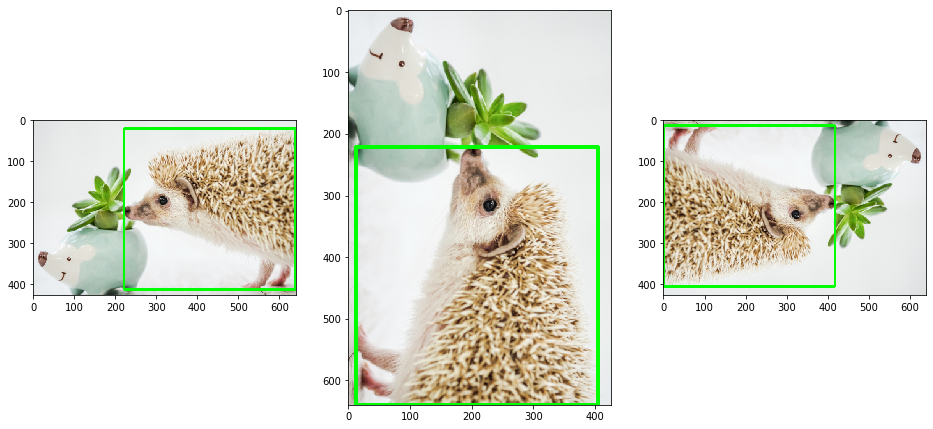

In [19]:
# 9．ランダム90度回転(RandomRotate90) ※N回90度回転
def compose_augmentation():
    transform = [
        album.RandomRotate90(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

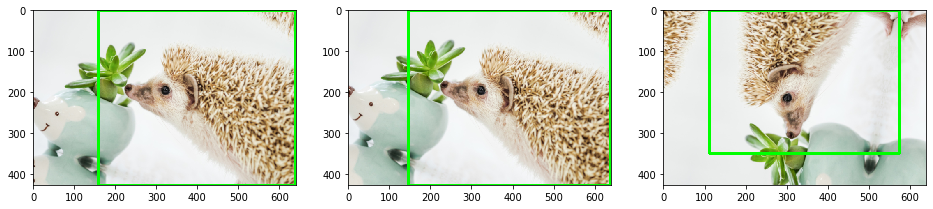

In [20]:
# 10．ランダム回転(Rotate)
def compose_augmentation():
    transform = [
        album.Rotate(limit=90, interpolation=1, border_mode=4, value=None, mask_value=None, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

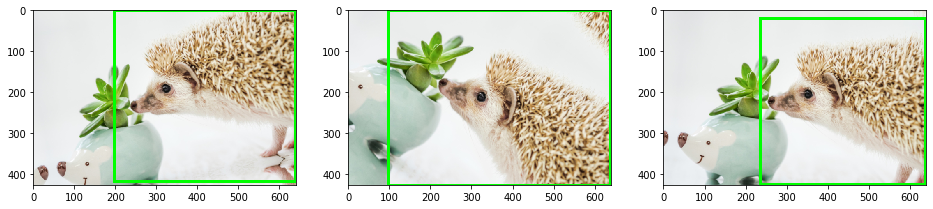

In [21]:
# 11．ランダムアフィン変換(ShiftScaleRotate) ※ランダムスケール、ランダム回転
def compose_augmentation():
    transform = [
        album.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, interpolation=1, border_mode=4, value=None, mask_value=None, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

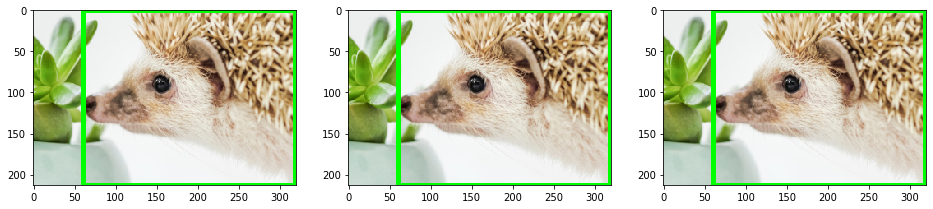

In [22]:
# 12．センタークロップ(CenterCrop)
crop_width, crop_height = int(test_image.shape[1] * 0.5), int(test_image.shape[0] * 0.5) 
def compose_augmentation():
    transform = [
        album.CenterCrop(width=crop_width, height=crop_height, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

In [23]:
# グリッド線描画関数
def create_grid_image(image, divide_num=6):
    width, height = image.shape[1], image.shape[0]
    debug_image = copy.deepcopy(image)

    for i in range(1, divide_num):
        debug_image = cv.line(debug_image, (int((width / divide_num) * i), 0), (int((width / divide_num) * i), height), (255, 0, 0), thickness=3)
        debug_image = cv.line(debug_image, (0, int((height / divide_num) * i)), (width, int((height / divide_num) * i)), (255, 0, 0), thickness=3)

    return debug_image

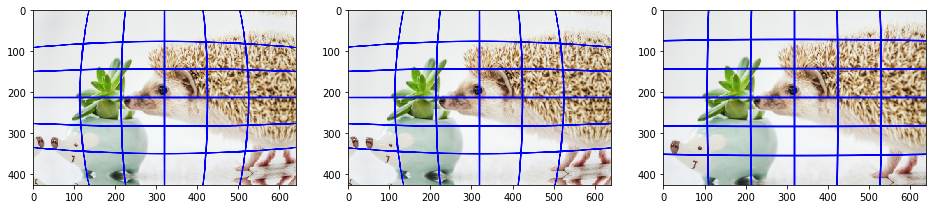

In [24]:
# 13．光学ひずみ(OpticalDistortion)
def compose_augmentation():
    transform = [
        album.OpticalDistortion(distort_limit=1, shift_limit=0.05, interpolation=1, border_mode=4, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform)

# グリッド線付与
grid_image = create_grid_image(test_image)

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(image=grid_image)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results, use_bbox=False)

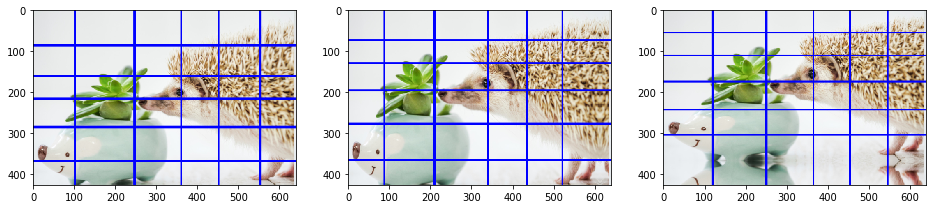

In [25]:
# 14．グリッドひずみ(GridDistortion)
def compose_augmentation():
    transform = [
        album.GridDistortion(num_steps=6, distort_limit=0.3, interpolation=1, border_mode=4, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform)

# グリッド線付与
grid_image = create_grid_image(test_image)

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(image=grid_image)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results, use_bbox=False)

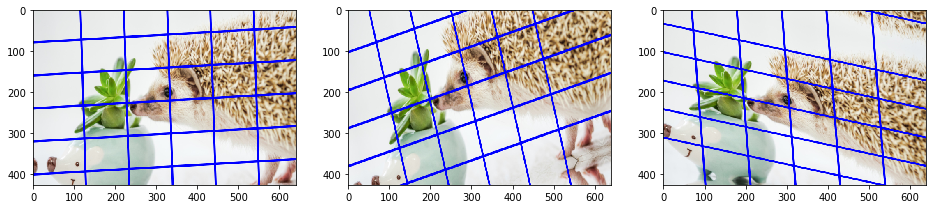

In [26]:
# 15．弾性変形(ElasticTransform)
def compose_augmentation():
    transform = [
        album.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, interpolation=1, border_mode=4, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform)

# グリッド線付与
grid_image = create_grid_image(test_image)

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(image=grid_image)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results, use_bbox=False)

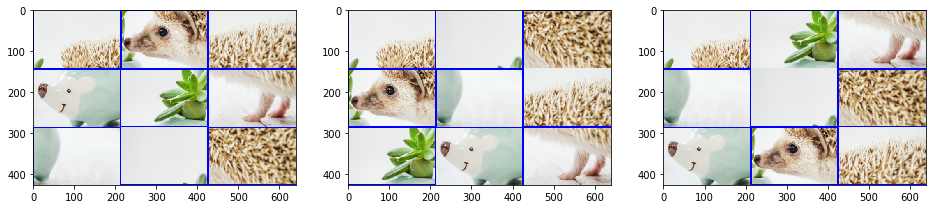

In [27]:
# 16．ランダムグリッドシャッフル(RandomGridShuffle)
def compose_augmentation():
    transform = [
        album.RandomGridShuffle(grid=(3, 3), p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform)

# グリッド線付与
grid_image = create_grid_image(test_image, 3)

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(image=grid_image)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results, use_bbox=False)

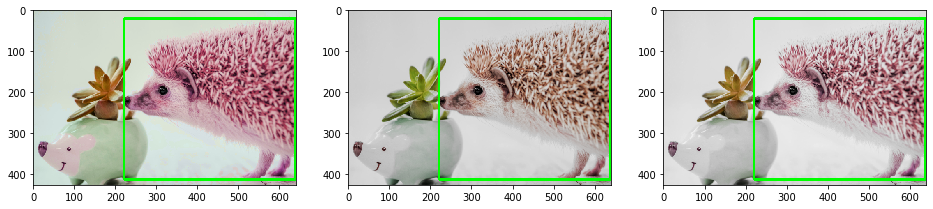

In [28]:
# 17．HSV変換(HueSaturationValue)
def compose_augmentation():
    transform = [
        album.HueSaturationValue(hue_shift_limit=30, sat_shift_limit=30, val_shift_limit=30, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

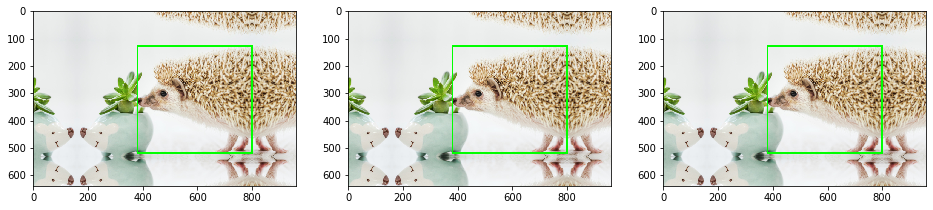

In [29]:
# 18．パッド付与(PadIfNeeded)
pad_width, pad_height = int(test_image.shape[1] * 1.5), int(test_image.shape[0] * 1.5) 
def compose_augmentation():
    transform = [
        album.PadIfNeeded(min_height=pad_height, min_width=pad_width, border_mode=4, value=None, mask_value=None, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

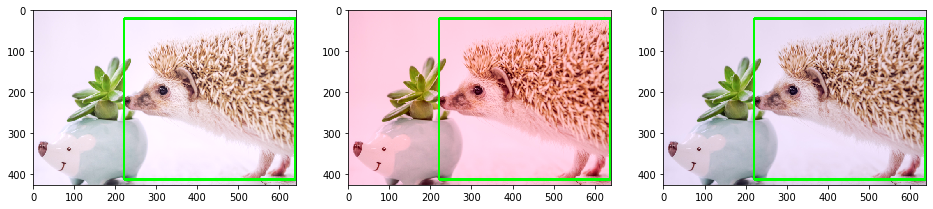

In [30]:
# 19．RGBランダムシフト(RGBShift)
def compose_augmentation():
    transform = [
        album.RGBShift(r_shift_limit=30, g_shift_limit=30, b_shift_limit=30, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

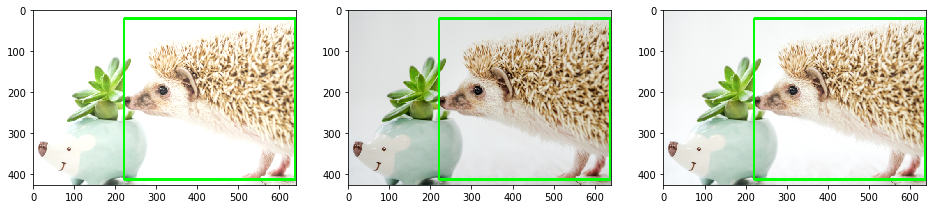

In [31]:
# 20．輝度ランダム変更(RandomBrightness)
def compose_augmentation():
    transform = [
        album.RandomBrightness(limit=0.2, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

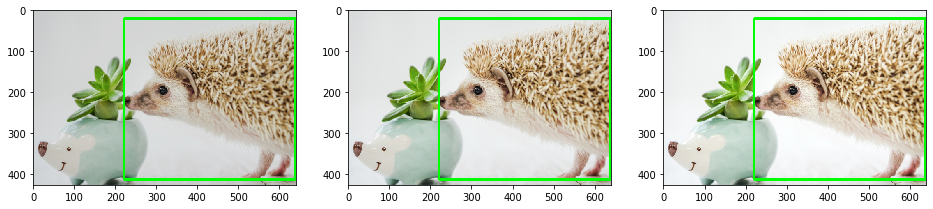

In [32]:
# 21．コントラストランダム変更(RandomContrast)
def compose_augmentation():
    transform = [
        album.RandomContrast(limit=0.2, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

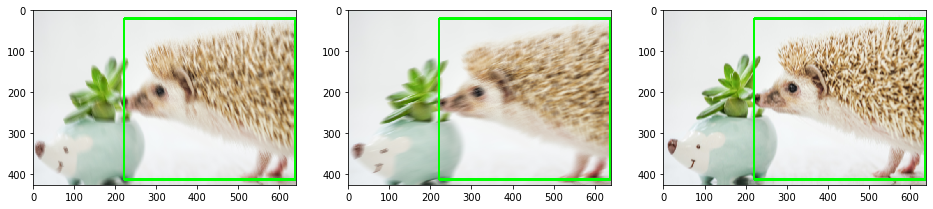

In [33]:
# 22．モーションブラー付与(MotionBlur)
def compose_augmentation():
    transform = [
        album.MotionBlur(blur_limit=30, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

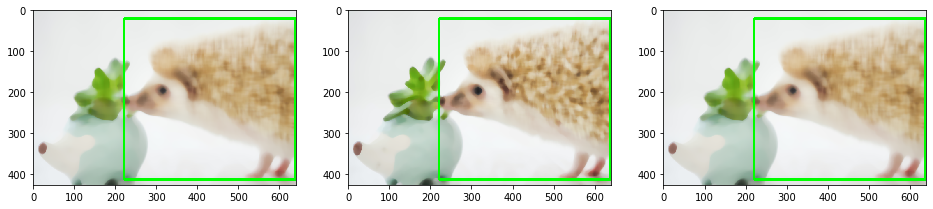

In [34]:
# 23．メディアンブラー付与(MedianBlur)
def compose_augmentation():
    transform = [
        album.MedianBlur(blur_limit=30, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

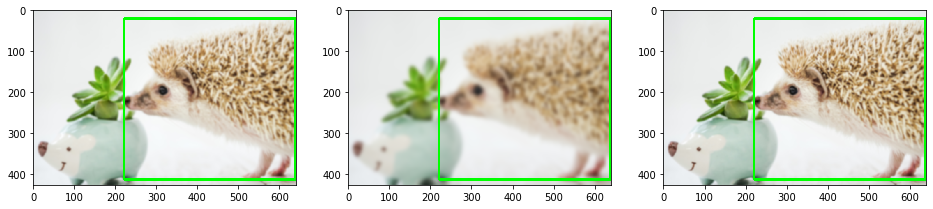

In [35]:
# 24．ガウシアンブラー付与(GaussianBlur)
def compose_augmentation():
    transform = [
        album.GaussianBlur(blur_limit=30, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

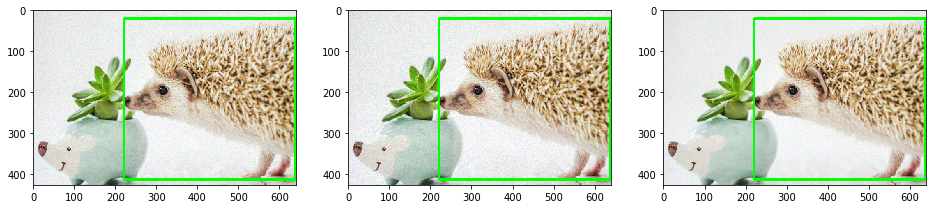

In [36]:
# 25．ガウスノイズ付与(GaussNoise)
def compose_augmentation():
    transform = [
        album.GaussNoise(var_limit=(10.0, 100.0), mean=0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

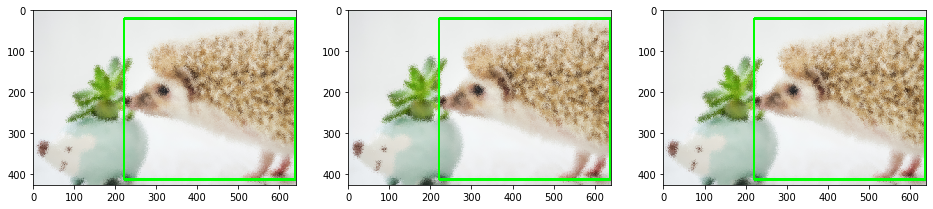

In [37]:
# 26．ガラスブラー付与(GlassBlur)
def compose_augmentation():
    transform = [
        album.GlassBlur(sigma=0.7, max_delta=4, iterations=2, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

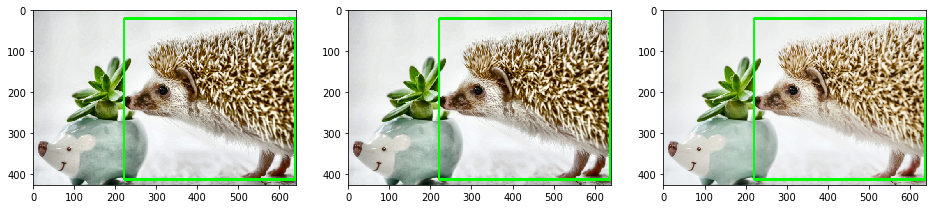

In [38]:
# 27．コントラスト制限付き適応ヒストグラム均等化(CLAHE)
def compose_augmentation():
    transform = [
        album.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

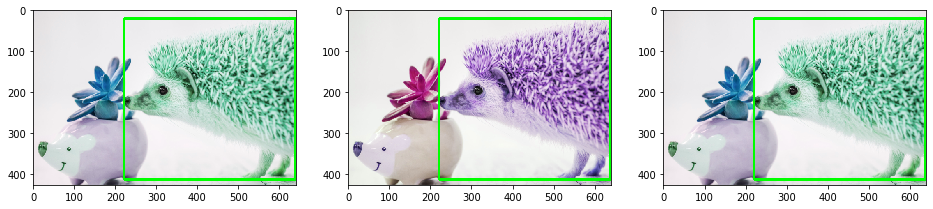

In [40]:
# 28．RGBチャンネルランダムシャッフル(ChannelShuffle)
def compose_augmentation():
    transform = [
        album.ChannelShuffle(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results, is_umat=True)

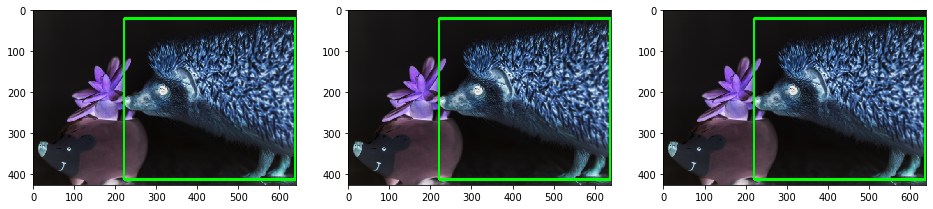

In [41]:
# 29．ピクセル値反転(InvertImg)
def compose_augmentation():
    transform = [
        album.InvertImg(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

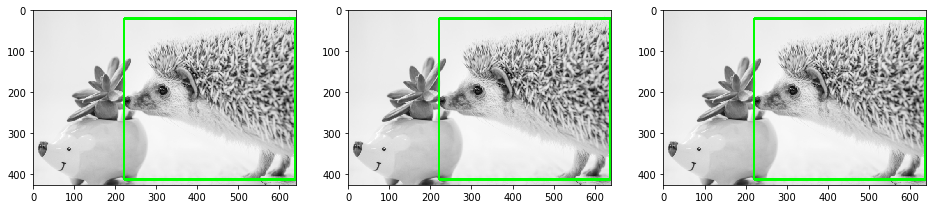

In [42]:
# 30．グレースケール化(ToGray)
def compose_augmentation():
    transform = [
        album.ToGray(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

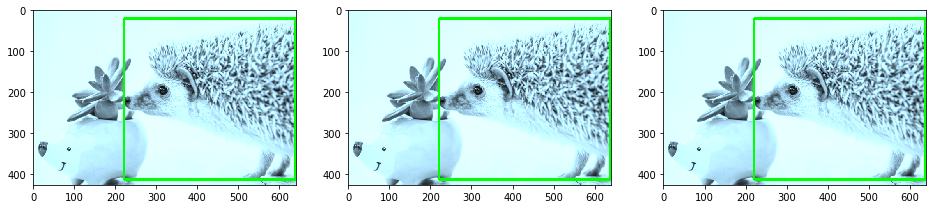

In [43]:
# 31．セピア化(ToSepia)
def compose_augmentation():
    transform = [
        album.ToSepia(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

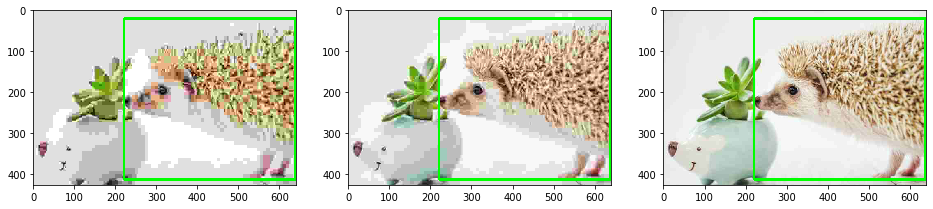

In [46]:
# 32．JPEG圧縮劣化(JpegCompression)
def compose_augmentation():
    transform = [
        album.JpegCompression(quality_lower=0, quality_upper=30, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

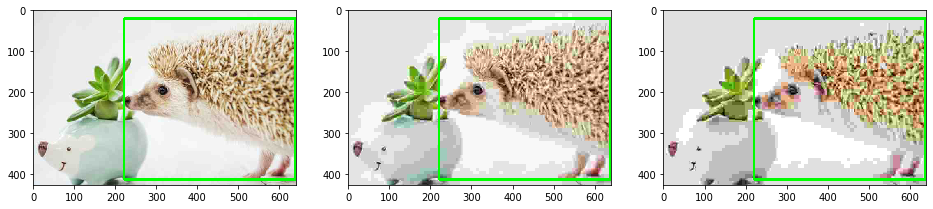

In [47]:
# 33．WebP圧縮劣化(ImageCompression)
def compose_augmentation():
    transform = [
        album.ImageCompression(quality_lower=0, quality_upper=30, compression_type=0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

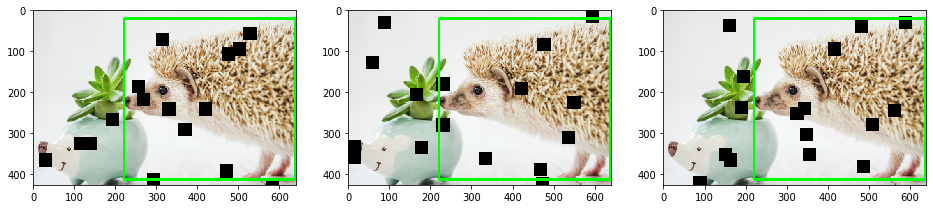

In [48]:
# 34．ランダムカットアウト(Cutout) ※正方形領域
def compose_augmentation():
    transform = [
        album.Cutout(num_holes=16, max_h_size=32, max_w_size=32, fill_value=0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

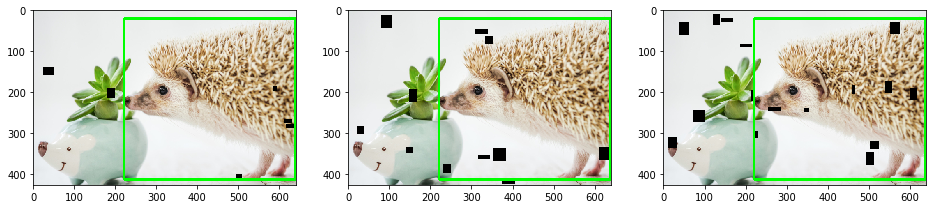

In [49]:
# 35．ランダムカットアウト(CoarseDropout) ※矩形領域
def compose_augmentation():
    transform = [
        album.CoarseDropout(max_holes=16, max_height=32, max_width=32, min_holes=1, min_height=8, min_width=8, fill_value=0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


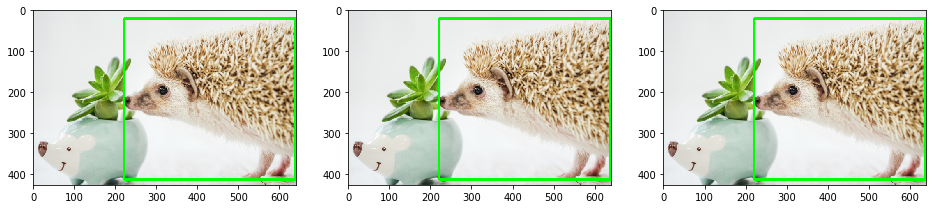

In [50]:
# 36．float化(ToFloat) ※0.0～1.0
def compose_augmentation():
    transform = [
        album.ToFloat(max_value=None, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

# 37.FromFloat向けデータ退避
float_image = augmented_results[0]['image']

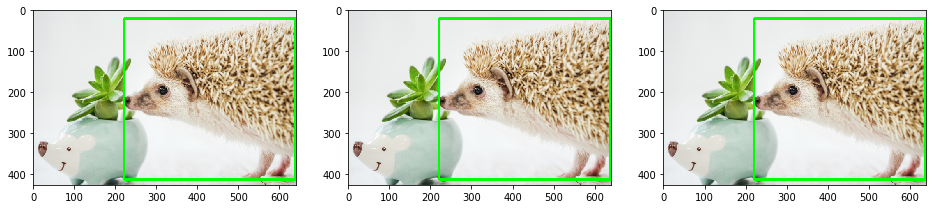

In [51]:
# 37．整数化(FromFloat)
def compose_augmentation():
    transform = [
        album.FromFloat(dtype='uint8', max_value=255, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(image=float_image, bboxes=bboxes, category_id=classes)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

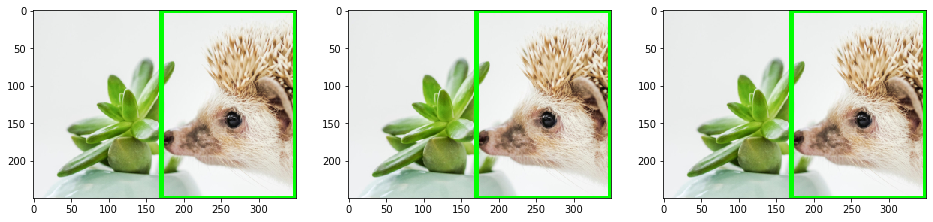

In [52]:
# 38．切り抜き(Crop)
def compose_augmentation():
    transform = [
        album.Crop(x_min=50, y_min=50, x_max=400, y_max=300, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

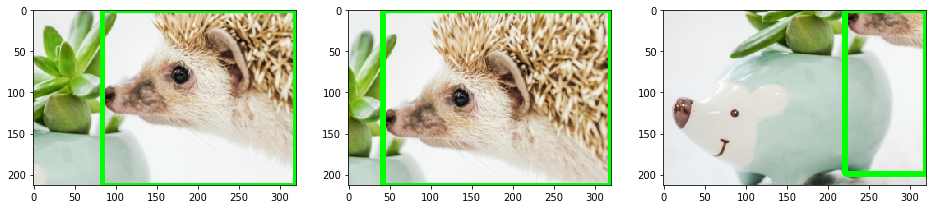

In [53]:
# 39．マスクを使用した切り抜き(CropNonEmptyMaskIfExists)
width, height = int(test_image.shape[1] * 0.5), int(test_image.shape[0] * 0.5) 
def compose_augmentation():
    transform = [
        album.CropNonEmptyMaskIfExists(height=height, width=width, ignore_values=None, ignore_channels=None, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(image=test_image, mask=test_maskimage, bboxes=bboxes, category_id=classes)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

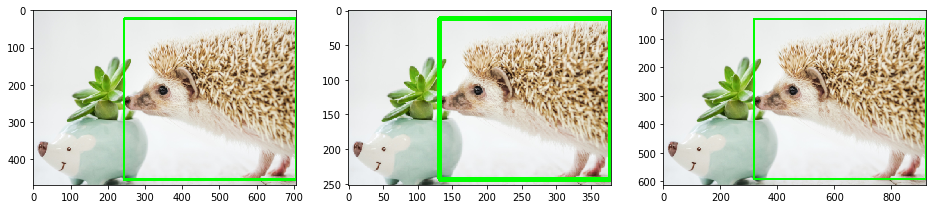

In [54]:
# 40．ランダムスケール(RandomScale)
def compose_augmentation():
    transform = [
        album.RandomScale(scale_limit=0.5, interpolation=1, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

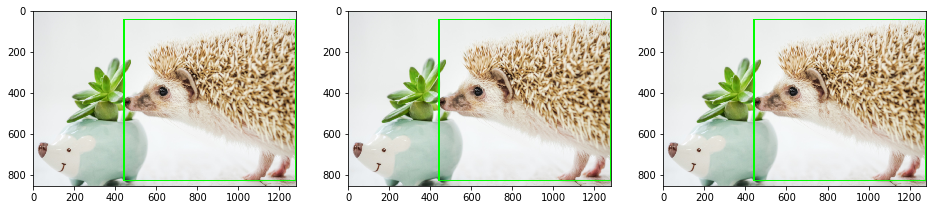

In [55]:
# 41．マックススケーリング(LongestMaxSize)
width = int(test_image.shape[1] * 2.0)
def compose_augmentation():
    transform = [
        album.LongestMaxSize(max_size=width, interpolation=1, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

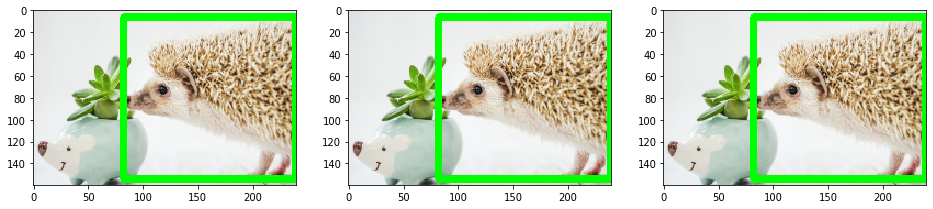

In [56]:
# 42．ミニマムスケーリング(SmallestMaxSize)
width = int(test_image.shape[1] * 0.25)
def compose_augmentation():
    transform = [
        album.SmallestMaxSize(max_size=width, interpolation=1, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

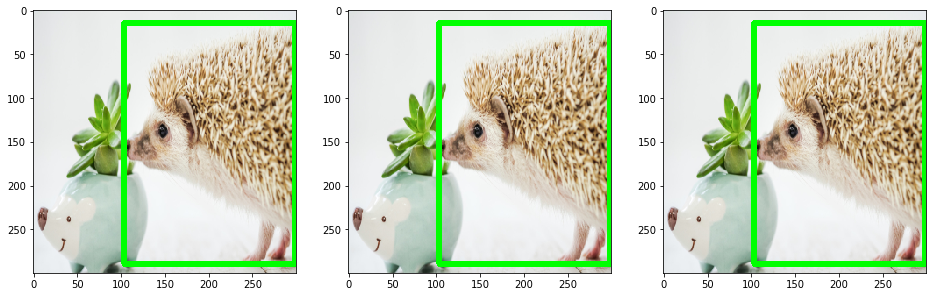

In [57]:
# 42．リサイズ(Resize)
def compose_augmentation():
    transform = [
        album.Resize(height=300, width=300, interpolation=1, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

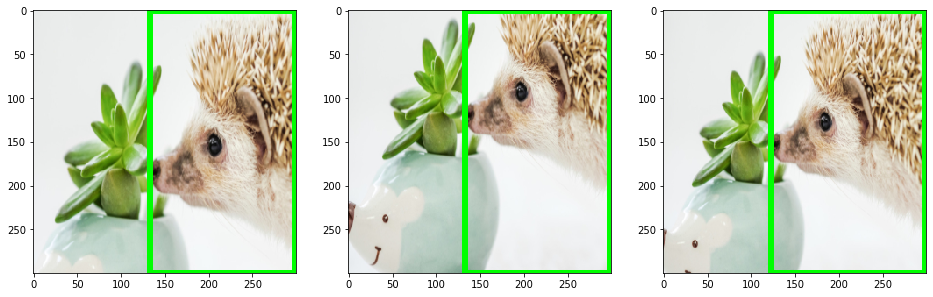

In [58]:
# 43．ランダムクロップ後、一定のサイズに再スケーリング(RandomSizedCrop)
width, height = int(test_image.shape[1] * 0.5), int(test_image.shape[0] * 0.5) 
def compose_augmentation():
    transform = [
        album.RandomSizedCrop(min_max_height=(height, width), height=300, width=300, w2h_ratio=(width/height), interpolation=1, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

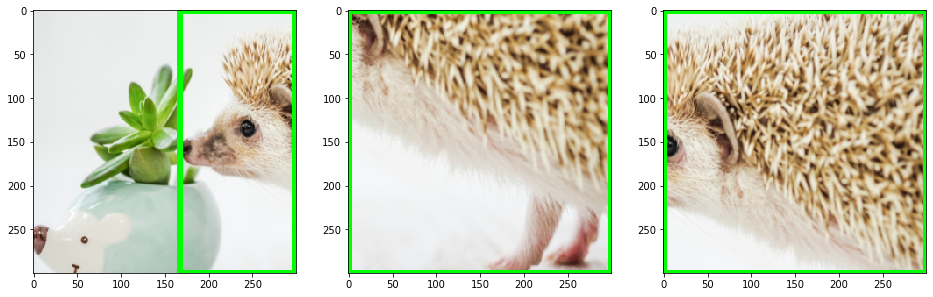

In [59]:
# 44．ランダムクロップ後、一定のサイズに再スケーリング(RandomResizedCrop)
width, height = int(test_image.shape[1] * 0.5), int(test_image.shape[0] * 0.5) 
def compose_augmentation():
    transform = [
        album.RandomResizedCrop(height=300, width=300, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

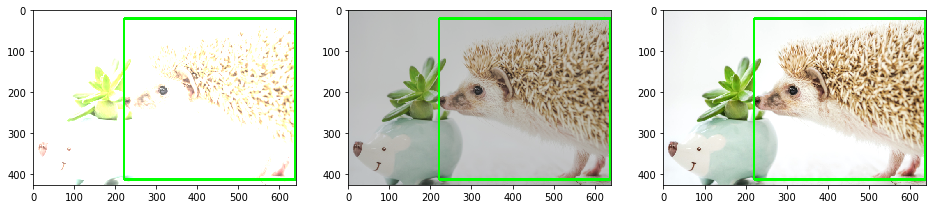

In [60]:
# 45．輝度およびコントラストのランダム変更(RandomSizedBBoxSafeCrop)
def compose_augmentation():
    transform = [
        album.RandomBrightnessContrast(brightness_limit=0.5, contrast_limit=0.5, brightness_by_max=True, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

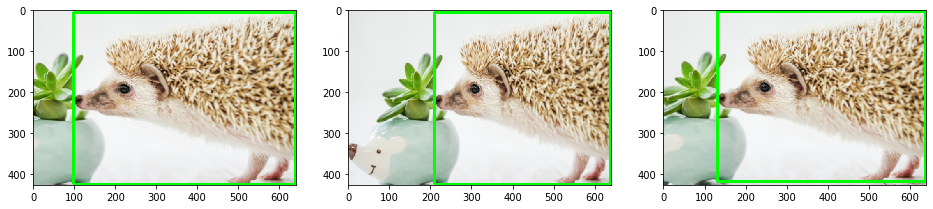

In [61]:
# 46．bboxを維持したランダムクロップ(RandomSizedBBoxSafeCrop)
width, height = int(test_image.shape[1] * 1.0), int(test_image.shape[0] * 1.0) 
def compose_augmentation():
    transform = [
        album.RandomSizedBBoxSafeCrop(height=height, width=width, erosion_rate=0.0, interpolation=1, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

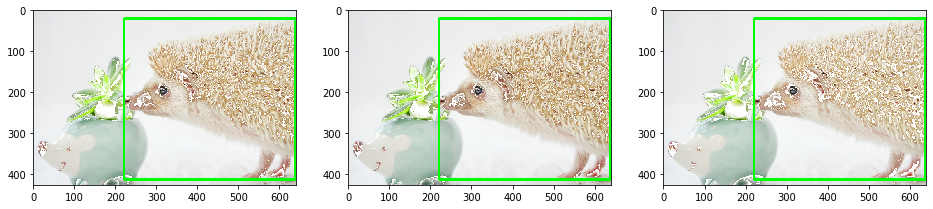

In [62]:
# 47．ランダム雪シミュレート(RandomSnow)
def compose_augmentation():
    transform = [
        album.RandomSnow(snow_point_lower=0.1, snow_point_upper=0.5, brightness_coeff=2.5, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

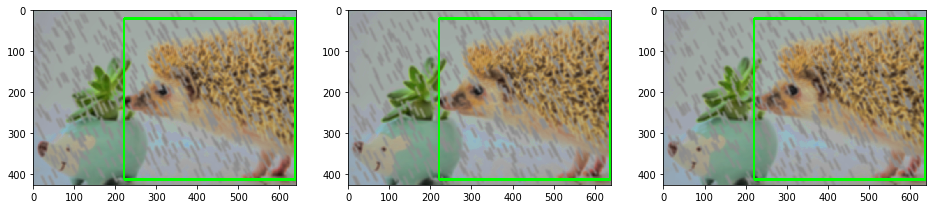

In [63]:
# 48-0．ランダム雨シミュレート(RandomRain) ※rain_type：None
def compose_augmentation():
    transform = [
        album.RandomRain(slant_lower=-10, slant_upper=10, drop_length=20, drop_width=3, drop_color=(200, 200, 200), blur_value=7, brightness_coefficient=0.7, rain_type=None, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

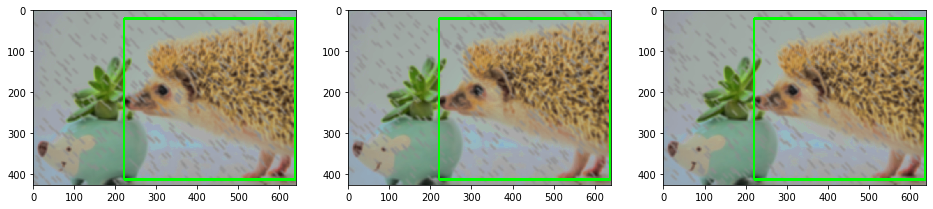

In [64]:
# 48-1．ランダム雨シミュレート(RandomRain) ※rain_type："drizzle"
def compose_augmentation():
    transform = [
        album.RandomRain(slant_lower=-10, slant_upper=10, drop_length=20, drop_width=3, drop_color=(200, 200, 200), blur_value=7, brightness_coefficient=0.7, rain_type="drizzle", p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

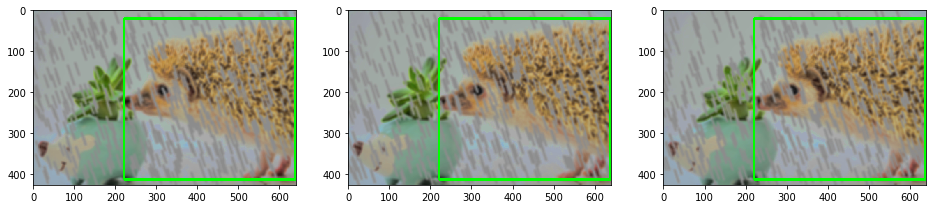

In [65]:
# 48-2．ランダム雨シミュレート(RandomRain) ※rain_type："heavy"
def compose_augmentation():
    transform = [
        album.RandomRain(slant_lower=-10, slant_upper=10, drop_length=20, drop_width=3, drop_color=(200, 200, 200), blur_value=7, brightness_coefficient=0.7, rain_type="heavy", p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

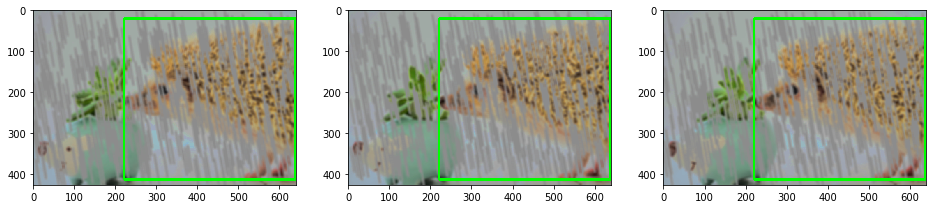

In [66]:
# 48-3．ランダム雨シミュレート(RandomRain) ※rain_type："torrential"
def compose_augmentation():
    transform = [
        album.RandomRain(slant_lower=-10, slant_upper=10, drop_length=20, drop_width=3, drop_color=(200, 200, 200), blur_value=7, brightness_coefficient=0.7, rain_type="torrential", p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

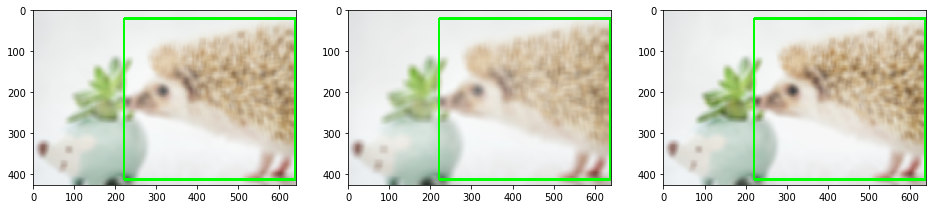

In [67]:
# 49．ランダム霧シミュレート(RandomFog)
def compose_augmentation():
    transform = [
        album.RandomFog(fog_coef_lower=0.3, fog_coef_upper=1, alpha_coef=0.08, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

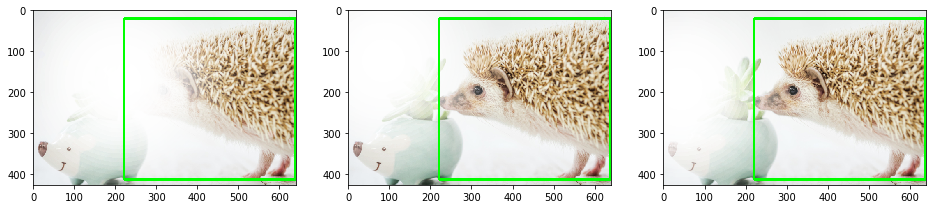

In [68]:
# 50．ランダム太陽シミュレート(RandomSunFlare)
def compose_augmentation():
    transform = [
        album.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), angle_lower=0, angle_upper=1, num_flare_circles_lower=6, num_flare_circles_upper=10, src_radius=400, src_color=(255, 255, 255), p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

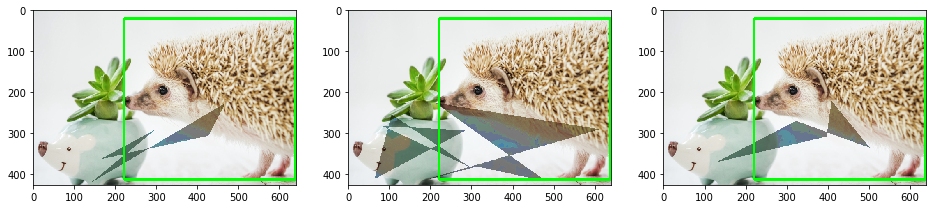

In [69]:
# 51．ランダム影シミュレート(RandomShadow)
def compose_augmentation():
    transform = [
        album.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=5, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

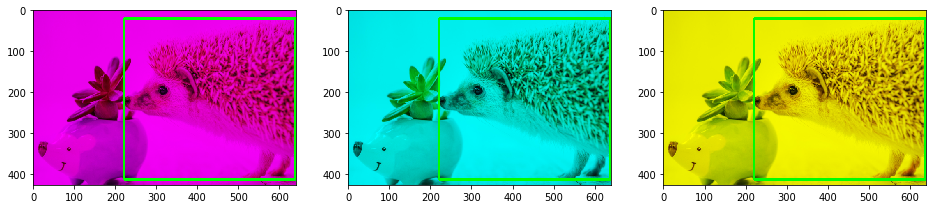

In [73]:
# 52．ランダムチャンネルドロップ(ChannelDropout)
def compose_augmentation():
    transform = [
        album.ChannelDropout(channel_drop_range=(1, 1), fill_value=0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

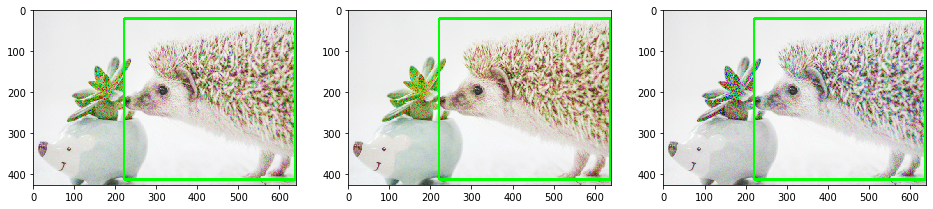

In [74]:
# 53．ISOノイズ(ISONoise)
def compose_augmentation():
    transform = [
        album.ISONoise(color_shift=(0.01, 0.5), intensity=(0.5, 0.9), p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

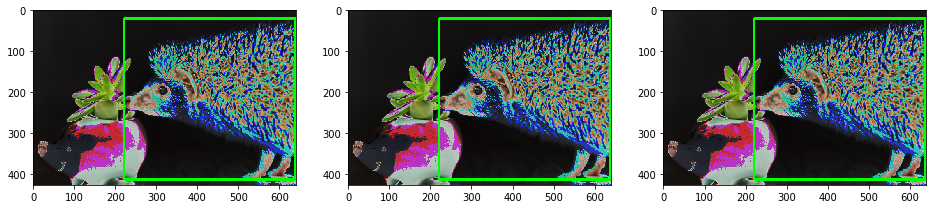

In [75]:
# 54．ソラリゼーション(Solarize) ※閾値を超えるピクセル値を反転
def compose_augmentation():
    transform = [
        album.Solarize(threshold=200, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

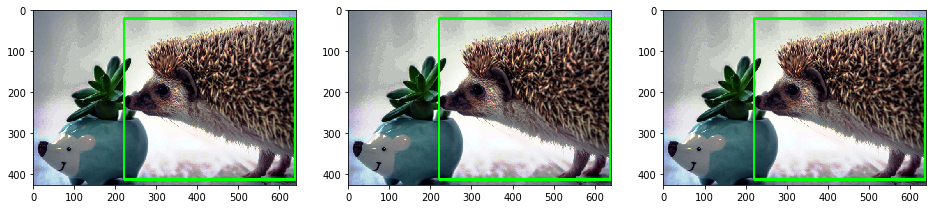

In [76]:
# 55．ヒストグラム平均化(Equalize)
def compose_augmentation():
    transform = [
        album.Equalize(mode='cv', by_channels=True, mask=None, mask_params=(), p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

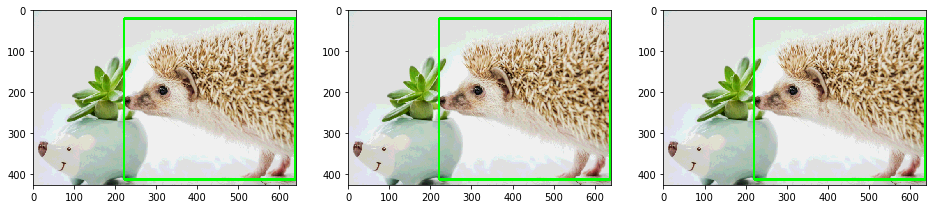

In [77]:
# 56．ポスタリゼーション(Posterize) ※各カラーチャネルのビット数を減らす
def compose_augmentation():
    transform = [
        album.Posterize(num_bits=4, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

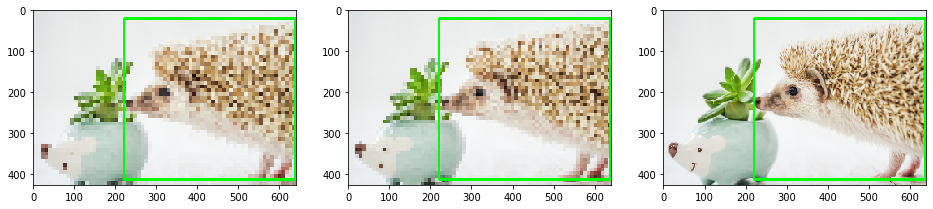

In [79]:
# 57．ダウンスケール/アップスケールバックによる画質低下(Downscale)
def compose_augmentation():
    transform = [
        album.Downscale(scale_min=0.10, scale_max=0.50, interpolation=0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

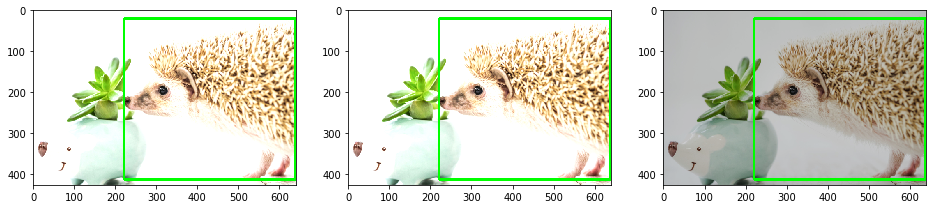

In [80]:
# 58．ノイズ乗算(MultiplicativeNoise)
def compose_augmentation():
    transform = [
        album.MultiplicativeNoise(multiplier=(0.7, 1.3), per_channel=False, elementwise=False, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

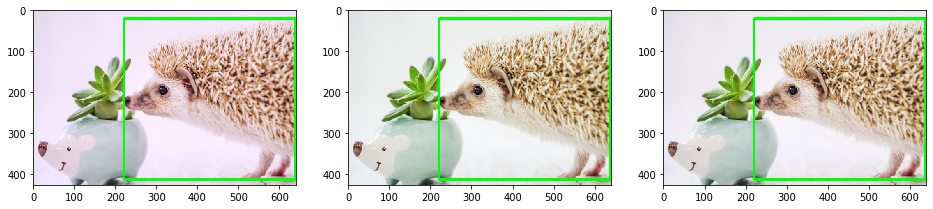

In [81]:
# 59．Fancy PCA
# 参考：https://pixelatedbrian.github.io/2018-04-29-fancy_pca/
def compose_augmentation():
    transform = [
        album.FancyPCA(alpha=0.3, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform, bbox_params={'format':'coco', 'label_fields':['category_id']})

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(**annotation)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results)

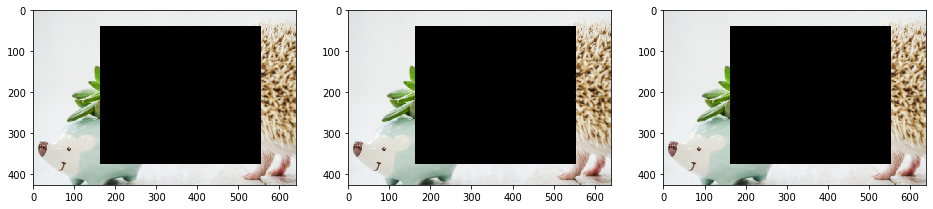

In [82]:
# 60．マスクドロップアウト(MaskDropout)
def compose_augmentation():
    transform = [
        album.MaskDropout(max_objects=1, image_fill_value=0, mask_fill_value=0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform)

# データ拡張実行
augment_function = compose_augmentation()

ret, maskimage = cv.threshold(test_maskimage, 128, 255, cv.THRESH_BINARY)

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(image=test_image, mask=maskimage)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results, use_bbox=False)

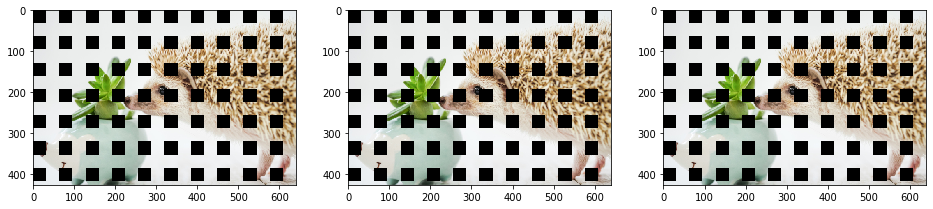

In [83]:
# 61．グリッドドロップアウト(GridDropout)
def compose_augmentation():
    transform = [
        album.GridDropout(ratio = 0.5, unit_size_min = None, unit_size_max = None, holes_number_x = None, holes_number_y = None, shift_x = 0, shift_y = 0, random_offset = False, fill_value = 0, mask_fill_value = None, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    return album.Compose(transform)

# データ拡張実行
augment_function = compose_augmentation()

number_of_trials = 3
augmented_results = []
for i in range(number_of_trials):
    augmented_result = augment_function(image=test_image)
    augmented_results.append(augmented_result)

# データ拡張結果描画
draw_boundingbox(augmented_results, use_bbox=False)

In [ ]:
# ToDo
# RandomCropNearBBox(max_part_shift=0.3, always_apply=False, p=1.0)[source]olor=(200, 200, 200), blur_value=7, brightness_coefficient=0.7, rain_type=None, always_apply=False, p=0.5)[source]
# Lambda(image=None, mask=None, keypoint=None, bbox=None, name=None, always_apply=False, p=1.0)[source]